In [ ]:
import glob
import os

import cv2
import imageio
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
vid_capture = cv2.VideoCapture('masked_video.mp4')

In [ ]:
mask_list = [[1300,60], [835,328], [660,1050], [1444,1020], [1670,1077], [1740,945], [945, 670], [1085,510], [1600, 500]]

# MAT CelebA

In [ ]:
!git clone https://github.com/fenglinglwb/MAT.git
%cd MAT
!pip install -r requirements.txt

Cloning into 'MAT'...
remote: Enumerating objects: 199, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 199 (delta 40), reused 43 (delta 37), pack-reused 151
Receiving objects: 100% (199/199), 18.89 MiB | 31.61 MiB/s, done.
Resolving deltas: 100% (84/84), done.
/content/MAT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.5/206.5 KB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 KB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 52.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 KB 24.9 MB/s eta 0:00:00
  Attempting uninstall: imageio-ffmpeg
    Found existing installation: imageio-ffmpeg 0.4.8
    Uninstalling imageio-ffmpeg-0.4.8:
      Successfully uni

In [ ]:
!mkdir pretrained
!mkdir images
!mkdir masks
!mkdir real_images
!mkdir samples
!mkdir big_samples

In [ ]:
%cd pretrained
!gdown 1g44IWkbq0NuEm-FBc5qUNxgBilLO8FjF
%cd ..

/content/MAT/pretrained
Downloading...
From: https://drive.google.com/uc?id=1g44IWkbq0NuEm-FBc5qUNxgBilLO8FjF
To: /content/MAT/pretrained/CelebA-HQ_512.pkl
100% 661M/661M [00:06<00:00, 99.2MB/s]
/content/MAT


In [ ]:
mask = np.ones((1080, 1920, 3), dtype=np.float32)
mask_list = np.array(mask_list, dtype=np.int32).reshape(-1, 1, 2)
filled_mask = cv2.fillPoly(mask, [mask_list], color=(0, 0, 0))
cropped_mask = filled_mask[0:1080, 660:1740]
resized_mask = cv2.resize(cropped_mask, (512, 512))

for i in range(130):
    ret, frame = vid_capture.read()
    if ret:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imsave(f'real_images/img_{i}.png', frame)
        croped_frame = frame[0:1080, 660:1740]
        croped_frame = cv2.resize(croped_frame, (512, 512))
        plt.imsave(f'images/img_{i}.png', croped_frame)
        plt.imsave(f'masks/mask_{i}.png', resized_mask)
    else:
        break

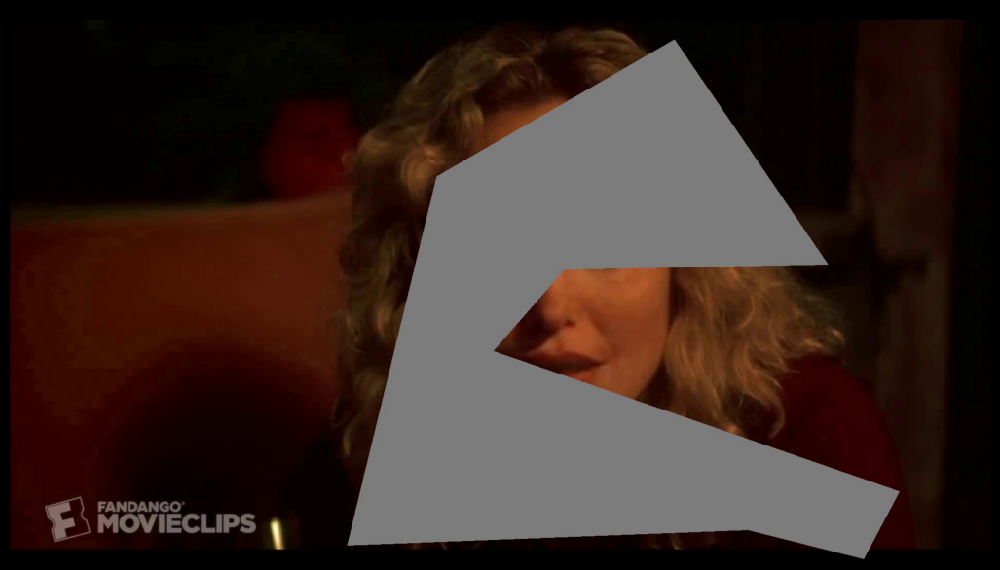

In [ ]:
plt.figure(figsize=(13, 10), facecolor='black')
plt.imshow(plt.imread('real_images/img_0.png'))
plt.axis('off')
plt.show()

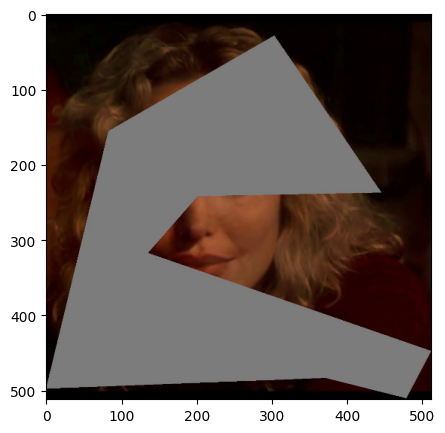

In [ ]:
croped_frame = frame[0:1080, 660:1740]
croped_frame = cv2.resize(croped_frame, (512, 512))
plt.figure(figsize=(5, 5))
plt.imshow(croped_frame)
plt.show()

Маска:

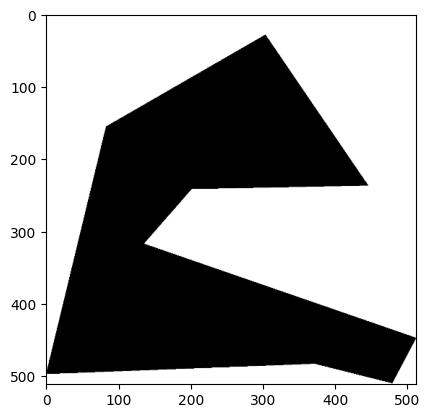

In [ ]:
mask = np.ones(frame.shape, dtype=np.float32)
mask_list = np.array(mask_list, dtype=np.int32).reshape(-1, 1, 2)
filled_mask = cv2.fillPoly(mask, [mask_list], color=(0, 0, 0))
cropped_mask = filled_mask[0:1080, 660:1740]
resized_mask = cv2.resize(cropped_mask, (512, 512))
plt.imshow(resized_mask)
plt.show()

Модель:

In [ ]:
!python generate_image.py --network pretrained/CelebA-HQ_512.pkl --dpath images --mpath masks --outdir samples

Loading data from: images
Loading mask from: masks
Loading networks from: pretrained/CelebA-HQ_512.pkl
Prcessing: img_0.png
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Prcessing: img_1.png
Prcessing: img_10.png
Prcessing: img_100.png
Prcessing: img_101.png
Prcessing: img_102.png
Prcessing: img_103.png
Prcessing: img_104.png
Prcessing: img_105.png
Prcessing: img_106.png
Prcessing: img_107.png
Prcessing: img_108.png
Prcessing: img_109.png
Prcessing: img_11.png
Prcessing: img_110.png
Prcessing: img_111.png
Prcessing: img_112.png
Prcessing: img_113.png
Prcessing: img_114.png
Prcessing: img_115.png
Prcessing: img_116.png
Prcessing: img_117.png
Prcessing: img_118.png
Prcessing: img_119.png
Prcessing: img_12.png
Prcessing: img_120.png
Prcessing: img_121.png
Prcessing: img_122.png
Prcessing: img_123.png
Prcessing: img_124.png
Prcessing: img_125.png
Prcessing: img_126.png
Prcessing: img_127.png
Prcessing: img_128.png
Prcessing: img_

In [ ]:
samples_path = 'samples'
samples_list = sorted(glob.glob(os.path.join(samples_path, '*.png')), key=lambda x: int(x.split('_')[-1].split('.')[0]))
len(samples_list)

130

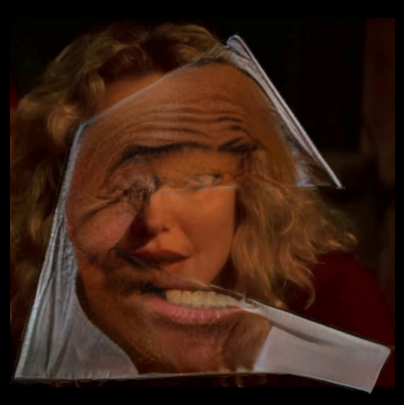

In [ ]:
plt.figure(figsize=(5, 5), facecolor='black')
plt.imshow(plt.imread('samples/img_0.png'))
plt.axis('off')
plt.show()

In [ ]:
path = 'real_images'
real_images_list = sorted(glob.glob(os.path.join(path, '*.png')), key=lambda x: int(x.split('_')[-1].split('.')[0]))
len(real_images_list)

130

In [ ]:
gif = []
k = 0

for i, j in zip(samples_list, real_images_list):
    each_image = cv2.imread(i)
    each_image = cv2.cvtColor(each_image, cv2.COLOR_BGR2RGB)
    each_image = cv2.resize(each_image, (1080, 1080))

    real_image = cv2.imread(j)
    real_image = cv2.cvtColor(real_image, cv2.COLOR_BGR2RGB)
    real_image[0:1080, 660:1740] = each_image

    plt.imsave(f'big_samples/img_{k}.png', real_image)
    
    image = imageio.imread(f'big_samples/img_{k}.png')
    gif.append(image)
    k += 1

%cd /content/

imageio.mimsave("big_celeba.gif", gif, 'GIF')

<ipython-input-15-a0f4d370c822>:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f'big_samples/img_{k}.png')


/content


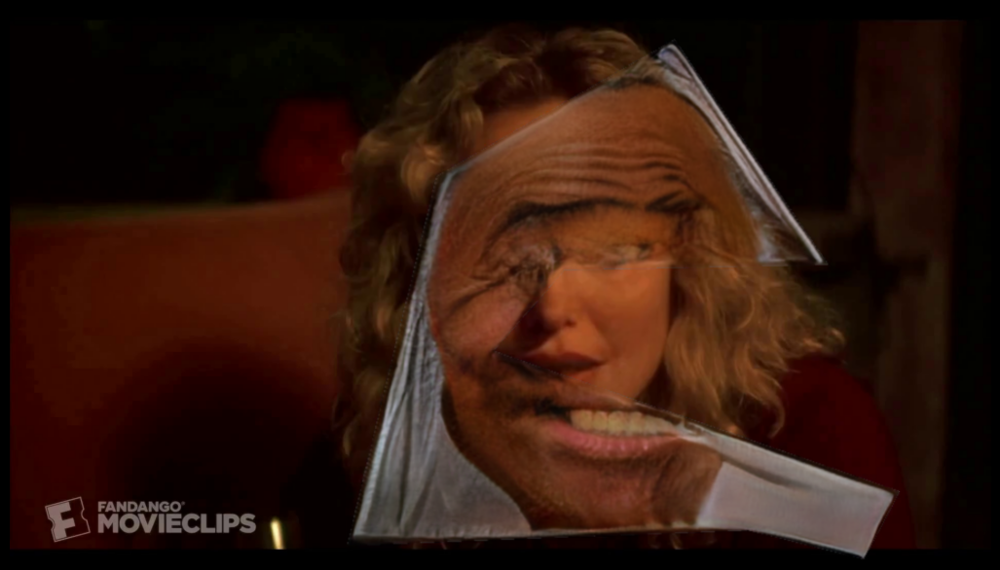

In [ ]:
plt.figure(figsize=(13, 10), facecolor='black')
plt.imshow(plt.imread('MAT/big_samples/img_0.png'))
plt.axis('off')
plt.show()

# MAT FFHQ

In [ ]:
%cd MAT

/content/MAT


In [ ]:
!rm -rf pretrained
!rm -rf samples
!rm -rf big_samples

In [ ]:
!mkdir pretrained
!mkdir samples
!mkdir big_samples

In [ ]:
%cd pretrained
!gdown 15XxOo7ExlMjrZ7UE-Bzu9hLilaajQu2L
%cd ..

/content/MAT/pretrained
Downloading...
From: https://drive.google.com/uc?id=15XxOo7ExlMjrZ7UE-Bzu9hLilaajQu2L
To: /content/MAT/pretrained/FFHQ_512.pkl
100% 661M/661M [01:54<00:00, 5.77MB/s]
/content/MAT


Модель:

In [ ]:
!python generate_image.py --network pretrained/FFHQ_512.pkl --dpath images --mpath masks --outdir samples

Loading data from: images
Loading mask from: masks
Loading networks from: pretrained/FFHQ_512.pkl
Prcessing: img_0.png
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Prcessing: img_1.png
Prcessing: img_10.png
Prcessing: img_100.png
Prcessing: img_101.png
Prcessing: img_102.png
Prcessing: img_103.png
Prcessing: img_104.png
Prcessing: img_105.png
Prcessing: img_106.png
Prcessing: img_107.png
Prcessing: img_108.png
Prcessing: img_109.png
Prcessing: img_11.png
Prcessing: img_110.png
Prcessing: img_111.png
Prcessing: img_112.png
Prcessing: img_113.png
Prcessing: img_114.png
Prcessing: img_115.png
Prcessing: img_116.png
Prcessing: img_117.png
Prcessing: img_118.png
Prcessing: img_119.png
Prcessing: img_12.png
Prcessing: img_120.png
Prcessing: img_121.png
Prcessing: img_122.png
Prcessing: img_123.png
Prcessing: img_124.png
Prcessing: img_125.png
Prcessing: img_126.png
Prcessing: img_127.png
Prcessing: img_128.png
Prcessing: img_129.p

In [ ]:
samples_path = 'samples'
samples_list = sorted(glob.glob(os.path.join(samples_path, '*.png')), key=lambda x: int(x.split('_')[-1].split('.')[0]))
len(samples_list)

130

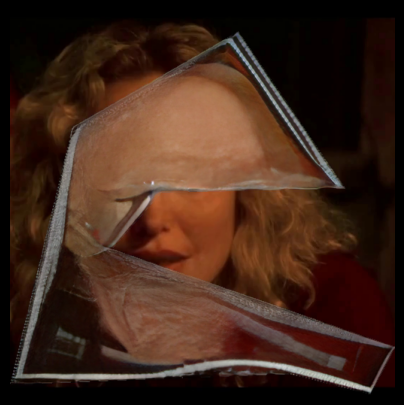

In [ ]:
plt.figure(figsize=(5, 5), facecolor='black')
plt.imshow(plt.imread('samples/img_0.png'))
plt.axis('off')
plt.show()

In [ ]:
path = 'real_images'
real_images_list = sorted(glob.glob(os.path.join(path, '*.png')), key=lambda x: int(x.split('_')[-1].split('.')[0]))
len(real_images_list)

130

In [ ]:
gif = []
k = 0

for i, j in zip(samples_list, real_images_list):
    each_image = cv2.imread(i)
    each_image = cv2.cvtColor(each_image, cv2.COLOR_BGR2RGB)
    each_image = cv2.resize(each_image, (1080, 1080))

    real_image = cv2.imread(j)
    real_image = cv2.cvtColor(real_image, cv2.COLOR_BGR2RGB)
    real_image[0:1080, 660:1740] = each_image

    plt.imsave(f'big_samples/img_{k}.png', real_image)
    
    image = imageio.imread(f'big_samples/img_{k}.png')
    gif.append(image)
    k += 1

%cd /content/

imageio.mimsave("big_ffhq.gif", gif, 'GIF')

<ipython-input-25-a476dbd2a171>:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f'big_samples/img_{k}.png')


/content


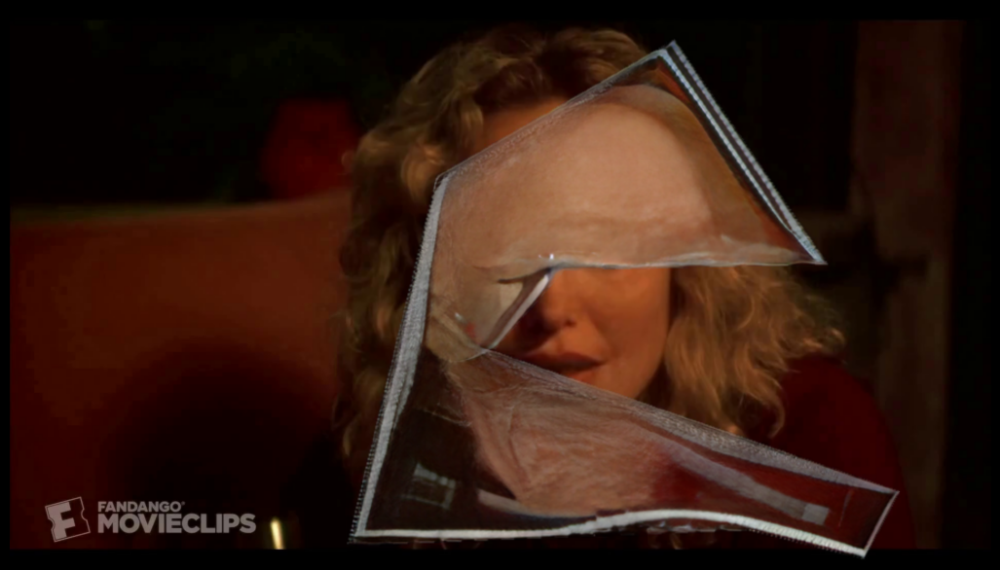

In [ ]:
plt.figure(figsize=(13, 10), facecolor='black')
plt.imshow(plt.imread('MAT/big_samples/img_0.png'))
plt.axis('off')
plt.show()

К сожалению, MAT не позволяет качественно восстановить закрашенный фрагмент, во всяком случае, у меня не получилось добиться хороших результатов восстановления, и я принял решение поэксперементировать с масками меньшего размера на одной фотографии 

# MAT inpainting + GPEN enhancement 1 picture

In [ ]:
!wget https://img-fotki.yandex.ru/get/94372/196666483.1b0/0_13b6a6_d7d72f6d_XXL.jpg

--2023-04-05 09:41:48--  https://img-fotki.yandex.ru/get/94372/196666483.1b0/0_13b6a6_d7d72f6d_XXL.jpg
Resolving img-fotki.yandex.ru (img-fotki.yandex.ru)... 77.88.21.31, 2a02:6b8::9c
Connecting to img-fotki.yandex.ru (img-fotki.yandex.ru)|77.88.21.31|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 114326 (112K) [image/jpeg]
Saving to: ‘0_13b6a6_d7d72f6d_XXL.jpg’

0_13b6a6_d7d72f6d_X 100%[===================>] 111.65K   311KB/s    in 0.4s    

2023-04-05 09:41:50 (311 KB/s) - ‘0_13b6a6_d7d72f6d_XXL.jpg’ saved [114326/114326]



In [ ]:
!git clone https://github.com/fenglinglwb/MAT.git
%cd MAT
!pip install -r requirements.txt

Cloning into 'MAT'...
remote: Enumerating objects: 199, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 199 (delta 40), reused 43 (delta 37), pack-reused 151
Receiving objects: 100% (199/199), 18.89 MiB | 40.47 MiB/s, done.
Resolving deltas: 100% (84/84), done.
/content/MAT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.5/206.5 KB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 KB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 41.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 KB 21.6 MB/s eta 0:00:00
  Attempting uninstall: imageio-ffmpeg
    Found existing installation: imageio-ffmpeg 0.4.8
    Uninstalling imageio-ffmpeg-0.4.8:
      Successfully uni

In [ ]:
!mkdir images
!mkdir masks
!mkdir samples
!mkdir pretrained

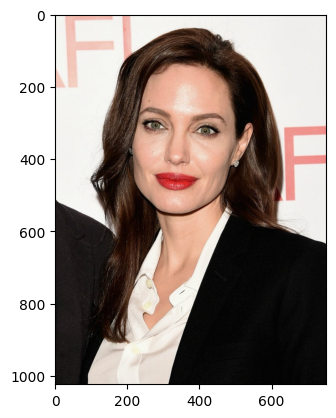

In [ ]:
plt.imshow(plt.imread('/content/0_13b6a6_d7d72f6d_XXL.jpg'))
plt.show()

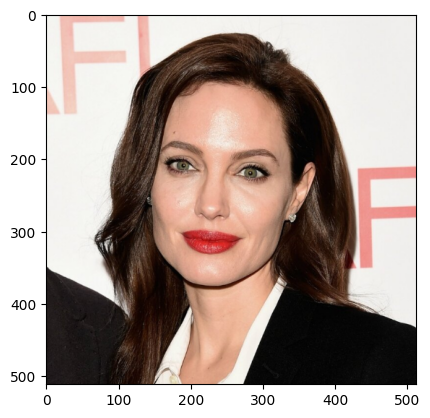

In [ ]:
pic = cv2.imread('/content/0_13b6a6_d7d72f6d_XXL.jpg')
pic = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB)
pic = pic[:752, :]
pic = cv2.resize(pic, (512, 512))
plt.imshow(pic)
plt.show()

1-ая маска:

In [ ]:
mask_list = [[100, 400], [300, 110], [200, 400]]
mask_list = np.array(mask_list).reshape(-1, 1, 2)

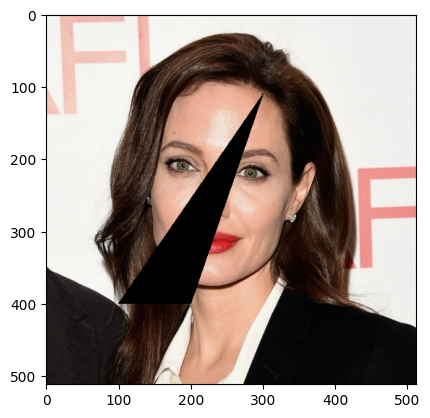

In [ ]:
pic_0 = cv2.fillPoly(pic, [mask_list], color=(0, 0, 0))
plt.imshow(pic_0)
plt.show()

plt.imsave('images/img_0.png', pic)

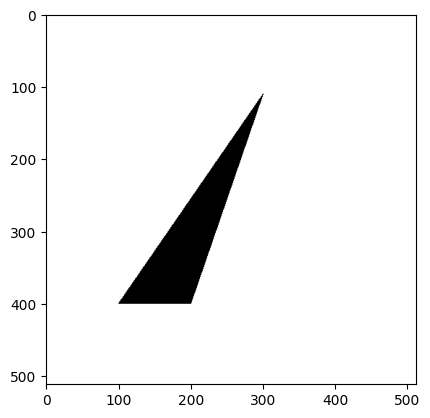

In [ ]:
mask = np.ones((512, 512, 3), dtype=np.float32)
filled_mask = cv2.fillPoly(mask, [mask_list], color=(0, 0, 0))
plt.imshow(filled_mask)
plt.show()

plt.imsave('masks/img_0.png', filled_mask)

2-ая маска:

In [ ]:
mask_list = [[50, 400], [300, 110], [250, 400]]
mask_list = np.array(mask_list).reshape(-1, 1, 2)

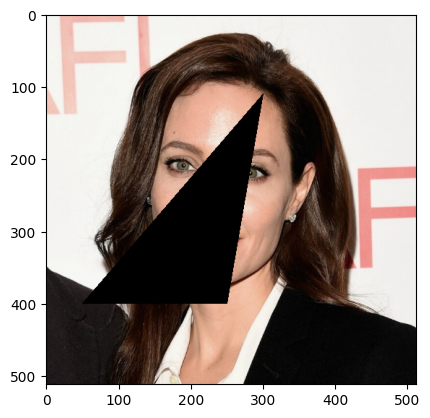

In [ ]:
pic_1 = cv2.fillPoly(pic, [mask_list], color=(0, 0, 0))
plt.imshow(pic_1)
plt.show()

plt.imsave('images/img_1.png', pic)

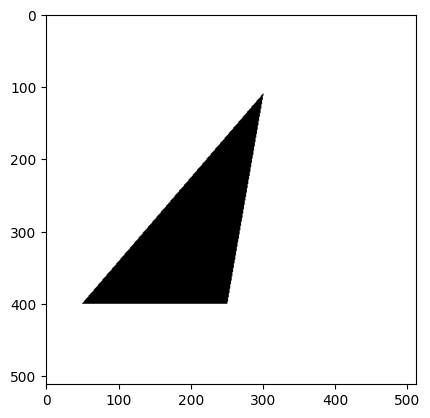

In [ ]:
mask = np.ones((512, 512, 3), dtype=np.float32)
filled_mask = cv2.fillPoly(mask, [mask_list], color=(0, 0, 0))
plt.imshow(filled_mask)
plt.show()

plt.imsave('masks/img_1.png', filled_mask)

Веса  CelebA:

In [ ]:
%cd pretrained
!gdown 1g44IWkbq0NuEm-FBc5qUNxgBilLO8FjF
%cd ..

/content/MAT/pretrained
Downloading...
From: https://drive.google.com/uc?id=1g44IWkbq0NuEm-FBc5qUNxgBilLO8FjF
To: /content/MAT/pretrained/CelebA-HQ_512.pkl
100% 661M/661M [00:06<00:00, 98.2MB/s]
/content/MAT


In [ ]:
!python generate_image.py --network pretrained/CelebA-HQ_512.pkl --dpath images --mpath masks --outdir samples

Loading data from: images
Loading mask from: masks
Loading networks from: pretrained/CelebA-HQ_512.pkl
Prcessing: img_0.png
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Prcessing: img_1.png


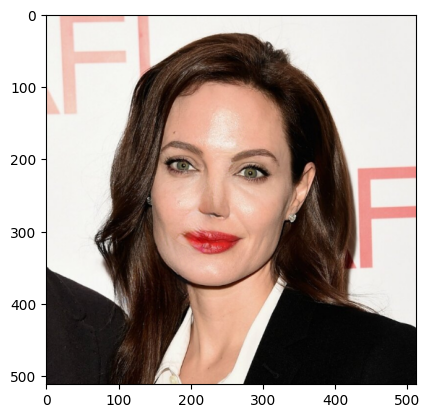

In [ ]:
plt.imshow(plt.imread('/content/MAT/samples/img_0.png'))
plt.show()

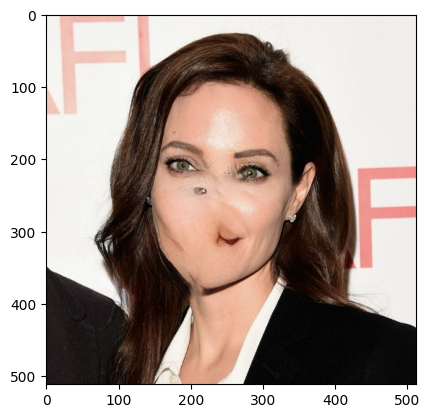

In [ ]:
plt.imshow(plt.imread('/content/MAT/samples/img_1.png'))
plt.show()

Веса FFHQ:

In [ ]:
%cd pretrained
!gdown 15XxOo7ExlMjrZ7UE-Bzu9hLilaajQu2L
%cd ..

/content/MAT/pretrained
Downloading...
From: https://drive.google.com/uc?id=15XxOo7ExlMjrZ7UE-Bzu9hLilaajQu2L
To: /content/MAT/pretrained/FFHQ_512.pkl
100% 661M/661M [00:09<00:00, 69.5MB/s]
/content/MAT


In [ ]:
!python generate_image.py --network pretrained/FFHQ_512.pkl --dpath images --mpath masks --outdir samples

Loading data from: images
Loading mask from: masks
Loading networks from: pretrained/FFHQ_512.pkl
Prcessing: img_0.png
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Prcessing: img_1.png


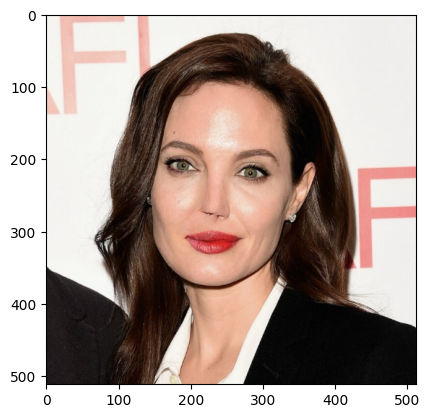

In [ ]:
plt.imshow(plt.imread('/content/MAT/samples/img_0.png'))
plt.show()

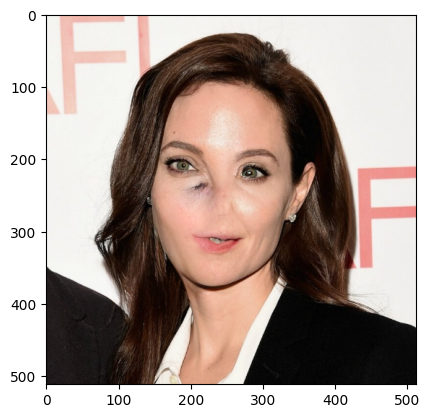

In [ ]:
plt.imshow(plt.imread('/content/MAT/samples/img_1.png'))
plt.show()

In [ ]:
%cd /content/
!git clone https://github.com/yangxy/GPEN.git
%cd GPEN
!pip install -r requirements.txt

/content
Cloning into 'GPEN'...
remote: Enumerating objects: 671, done.
remote: Counting objects: 100% (161/161), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 671 (delta 118), reused 110 (delta 109), pack-reused 510
Receiving objects: 100% (671/671), 187.58 MiB | 36.85 MiB/s, done.
Resolving deltas: 100% (187/187), done.
/content/GPEN
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 KB 13.5 MB/s eta 0:00:00


In [ ]:
!mkdir images
!mkdir samples

In [ ]:
%cd weights/
!wget https://public-vigen-video.oss-cn-shanghai.aliyuncs.com/robin/models/GPEN-BFR-512.pth
!wget https://public-vigen-video.oss-cn-shanghai.aliyuncs.com/robin/models/RetinaFace-R50.pth
!wget https://public-vigen-video.oss-cn-shanghai.aliyuncs.com/robin/models/realesrnet_x4.pth
!wget https://public-vigen-video.oss-cn-shanghai.aliyuncs.com/robin/models/ParseNet-latest.pth
%cd ..

/content/GPEN/weights
--2023-04-05 08:21:26--  https://public-vigen-video.oss-cn-shanghai.aliyuncs.com/robin/models/GPEN-BFR-512.pth
Resolving public-vigen-video.oss-cn-shanghai.aliyuncs.com (public-vigen-video.oss-cn-shanghai.aliyuncs.com)... 47.101.88.10
Connecting to public-vigen-video.oss-cn-shanghai.aliyuncs.com (public-vigen-video.oss-cn-shanghai.aliyuncs.com)|47.101.88.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 284085738 (271M) [application/octet-stream]
Saving to: ‘GPEN-BFR-512.pth’

GPEN-BFR-512.pth    100%[===================>] 270.92M  8.28MB/s    in 40s     

2023-04-05 08:22:07 (6.84 MB/s) - ‘GPEN-BFR-512.pth’ saved [284085738/284085738]

--2023-04-05 08:22:07--  https://public-vigen-video.oss-cn-shanghai.aliyuncs.com/robin/models/RetinaFace-R50.pth
Resolving public-vigen-video.oss-cn-shanghai.aliyuncs.com (public-vigen-video.oss-cn-shanghai.aliyuncs.com)... 47.101.88.10
Connecting to public-vigen-video.oss-cn-shanghai.aliyuncs.com (public

In [ ]:
!python demo.py --task FaceEnhancement --model GPEN-BFR-512 --in_size 512 --channel_multiplier 2 --narrow 1 --use_sr --sr_scale 4 --save_face --indir images --outdir samples

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
0 img_0_FFHQ


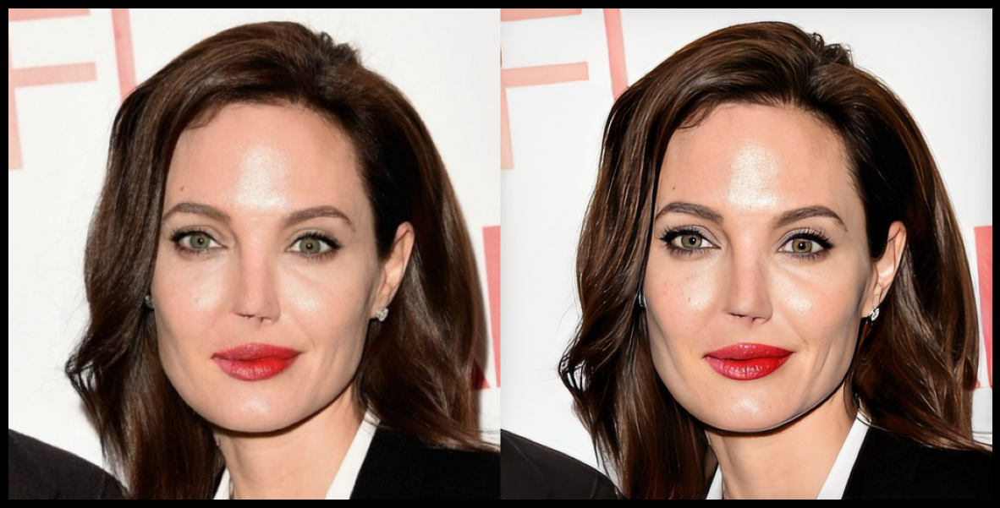

In [ ]:
plt.figure(figsize=(15, 10), facecolor='black')
plt.imshow(plt.imread('samples/img_0_FFHQ_face00.jpg'))
plt.axis('off')
plt.show()

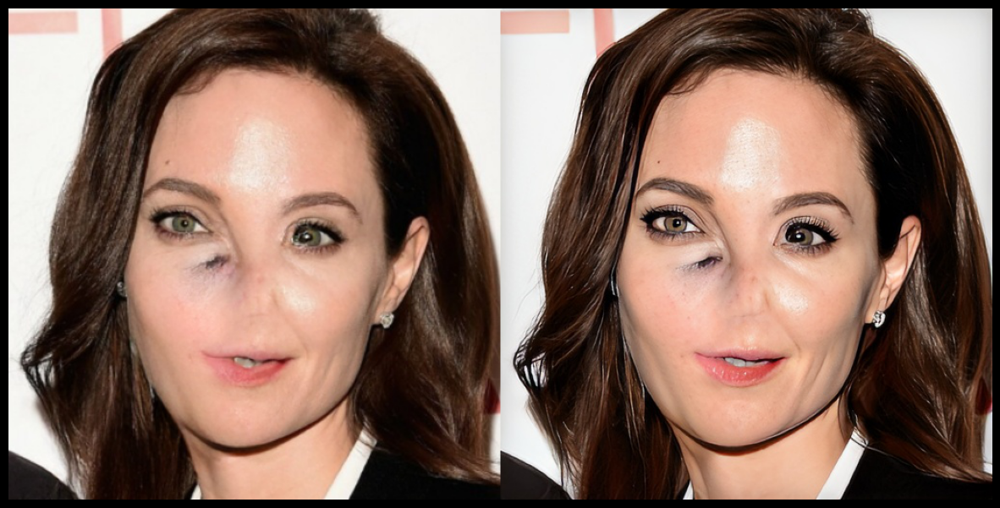

In [ ]:
plt.figure(figsize=(15, 10), facecolor='black')
plt.imshow(plt.imread('samples/img_1_FFHQ_face00.jpg'))
plt.axis('off')
plt.show()

Грубо говоря, GPEN просто добавила макияжа, но при этом не избавила от недочетов восстановления картинки

# GPEN inpainting + GPEN enhancement 1 picture

Немного поменял код в файле demo.py, чтобы не генерировались случайные маски, и, если цвет маски белый, то GPEN восстановит закрашенный фрагмент (с черным цветом маски восстановления не происходило)

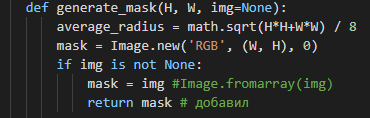

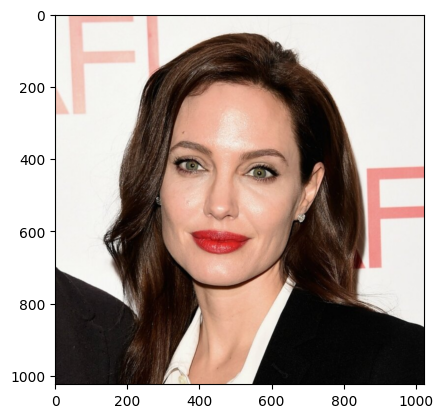

In [ ]:
pic = cv2.imread('/content/0_13b6a6_d7d72f6d_XXL.jpg')
pic = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB)
pic = pic[:752, :]
pic = cv2.resize(pic, (1024, 1024))
plt.imshow(pic)
plt.show()

1-ая маска:

In [ ]:
mask_list = [[100, 400], [300, 110], [200, 400]]
mask_list = np.array(mask_list).reshape(-1, 1, 2) * 2

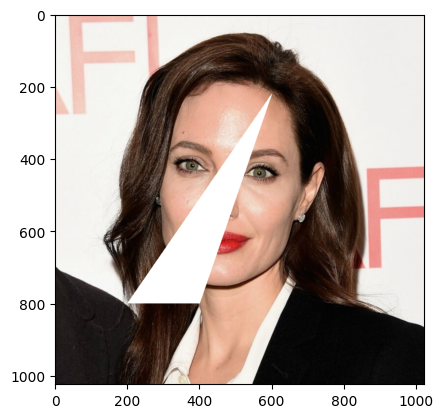

In [ ]:
pic_0 = cv2.fillPoly(pic, [mask_list], color=(255, 255, 255))
plt.imshow(pic_0)
plt.show()

plt.imsave('images/img_0.png', pic)

2-ая маска:

In [ ]:
mask_list = [[50, 400], [300, 110], [250, 400]]
mask_list = np.array(mask_list).reshape(-1, 1, 2) * 2

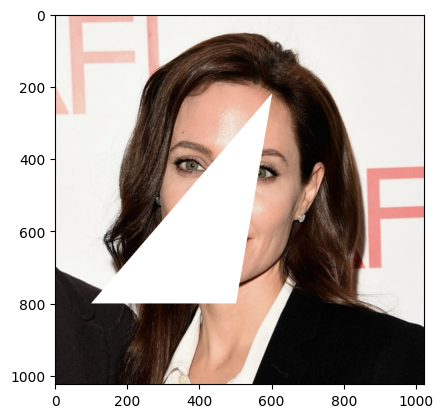

In [ ]:
pic_1 = cv2.fillPoly(pic, [mask_list], color=(255, 255, 255))
plt.imshow(pic_1)
plt.show()

plt.imsave('images/img_1.png', pic)

In [ ]:
%cd weights/
!wget https://public-vigen-video.oss-cn-shanghai.aliyuncs.com/robin/models/GPEN-Inpainting-1024.pth
%cd ..

/content/GPEN/weights
--2023-04-04 13:02:01--  https://public-vigen-video.oss-cn-shanghai.aliyuncs.com/robin/models/GPEN-Inpainting-1024.pth
Resolving public-vigen-video.oss-cn-shanghai.aliyuncs.com (public-vigen-video.oss-cn-shanghai.aliyuncs.com)... 47.101.88.10
Connecting to public-vigen-video.oss-cn-shanghai.aliyuncs.com (public-vigen-video.oss-cn-shanghai.aliyuncs.com)|47.101.88.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 284914645 (272M) [application/octet-stream]
Saving to: ‘GPEN-Inpainting-1024.pth’

GPEN-Inpainting-102 100%[===================>] 271.71M  8.35MB/s    in 40s     

2023-04-04 13:02:43 (6.81 MB/s) - ‘GPEN-Inpainting-1024.pth’ saved [284914645/284914645]

/content/GPEN


In [ ]:
!python demo.py --task FaceInpainting --model GPEN-Inpainting-1024 --in_size 1024 --indir images --outdir samples_1

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
0 img_0


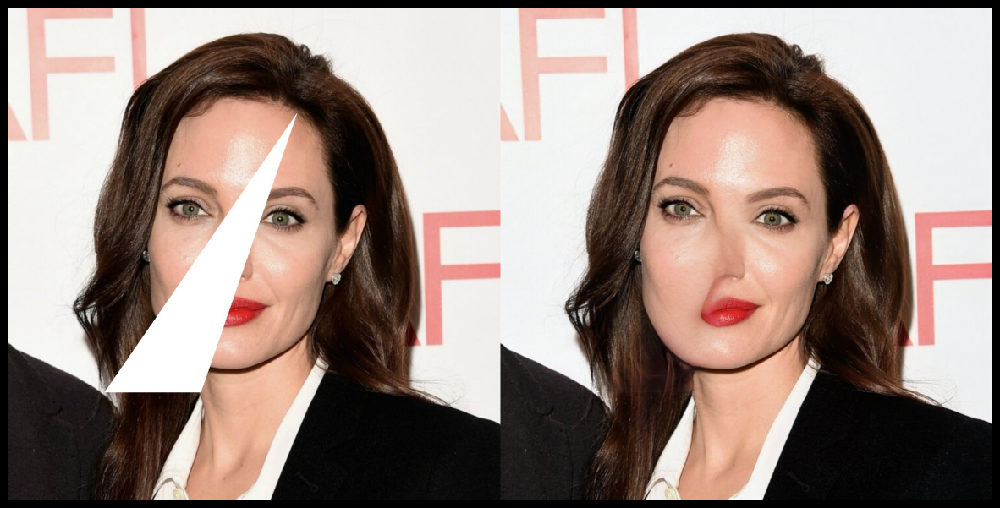

In [ ]:
plt.figure(figsize=(15, 10), facecolor='black')
plt.imshow(plt.imread('samples_1/img_0_COMP.jpg'))
plt.axis('off')
plt.show()

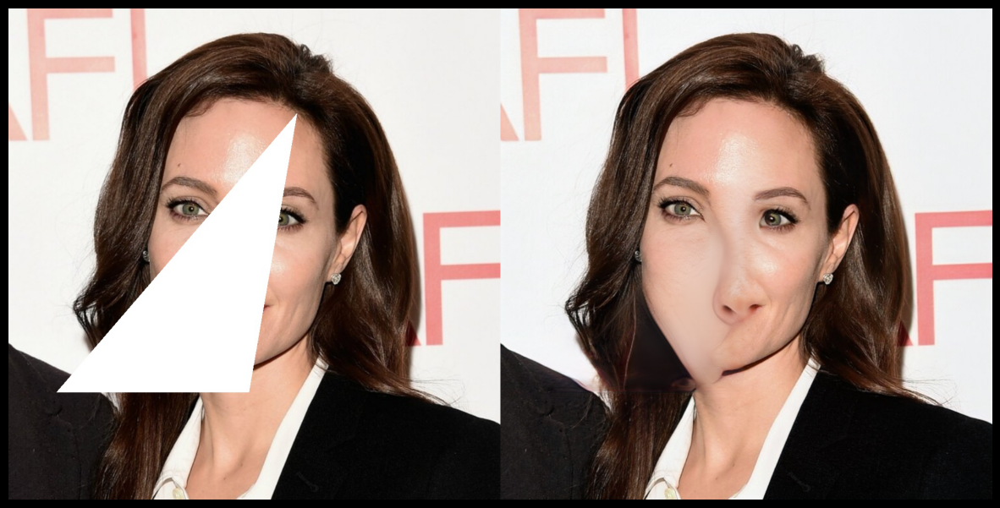

In [ ]:
plt.figure(figsize=(15, 10), facecolor='black')
plt.imshow(plt.imread('/content/GPEN/samples_1/img_1_COMP.jpg'))
plt.axis('off')
plt.show()

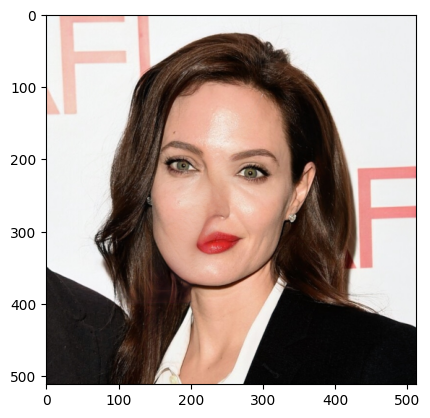

In [ ]:
pic = cv2.imread('samples_1/img_0_GPEN.jpg')
pic = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB)
pic = cv2.resize(pic, (512, 512))
plt.imshow(pic)
plt.show()

plt.imsave('images/img_0.png', pic)

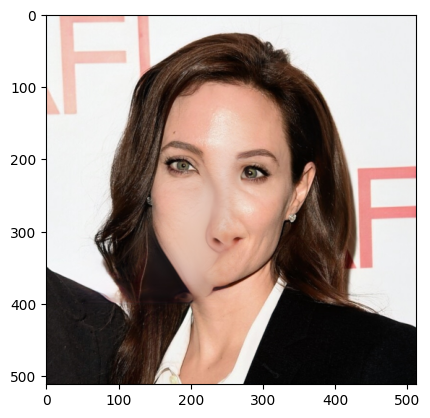

In [ ]:
pic = cv2.imread('samples_1/img_1_GPEN.jpg')
pic = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB)
pic = cv2.resize(pic, (512, 512))
plt.imshow(pic)
plt.show()

plt.imsave('images/img_1.png', pic)

In [ ]:
!python demo.py --task FaceEnhancement --model GPEN-BFR-512 --in_size 512 --channel_multiplier 2 --narrow 1 --use_sr --sr_scale 4 --save_face --indir images --outdir samples_2

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
0 img_0


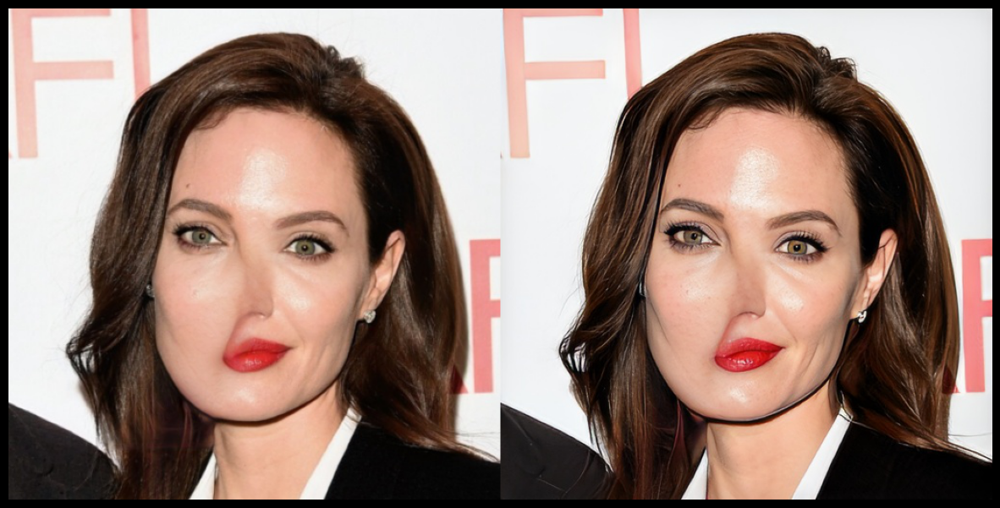

In [ ]:
plt.figure(figsize=(15, 10), facecolor='black')
plt.imshow(plt.imread('/content/GPEN/samples_2/img_0_face00.jpg'))
plt.axis('off')
plt.show()

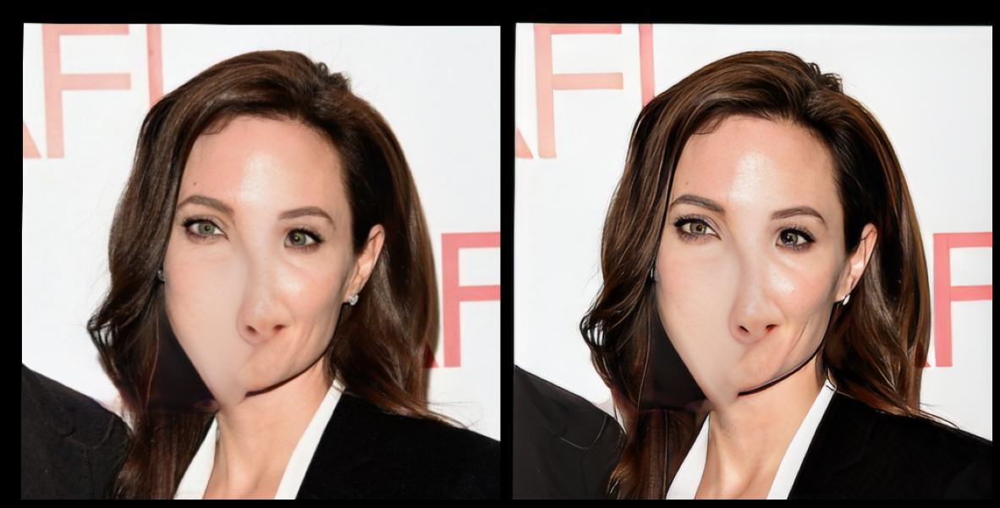

In [ ]:
plt.figure(figsize=(15, 10), facecolor='black')
plt.imshow(plt.imread('/content/GPEN/samples_2/img_1_face00.jpg'))
plt.axis('off')
plt.show()

# SimSwap

Использовался скрипт test_wholeimage_swapsingle.py на следующих двух фотографиях:

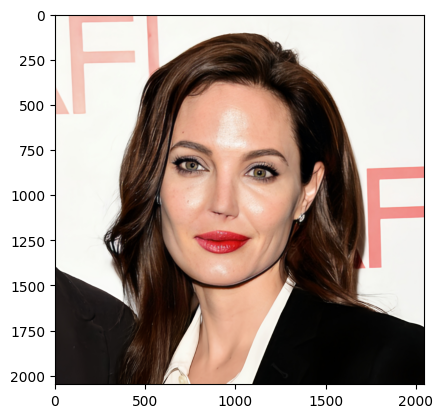

In [ ]:
plt.imshow(plt.imread('img_0_FFHQ_GPEN.jpg'))
plt.show()

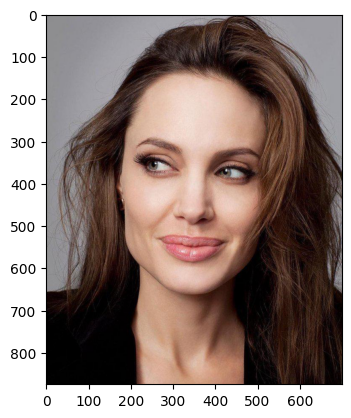

In [ ]:
plt.imshow(plt.imread('img.jpg'))
plt.show()

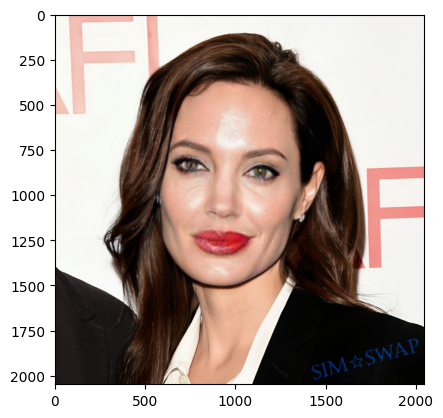

In [ ]:
plt.imshow(plt.imread('result_whole_swapsingle.jpg'))
plt.show()

# Вывод:

На данный момент библиотека MAT не показывает заявленных результатов для инпэйнтинга или, по крайней мере, мне не удалось достичь подобных результатов, где закрыто маской более 80% лица и происходит качественное восстановление. В README будут приложены неудачные попытки покадрово восстановить видео с помощью MAT с весами моделей, натренированных на датасетах CelebA и FFHQ, а также небольщой пул экспериментов с восстановлением 1 фотографии с масками меньшего размера при помощи библиотек MAT и GPEN и последующим улучшением от GPEN, и пересадкой лица от SimSwap

Оригинал:

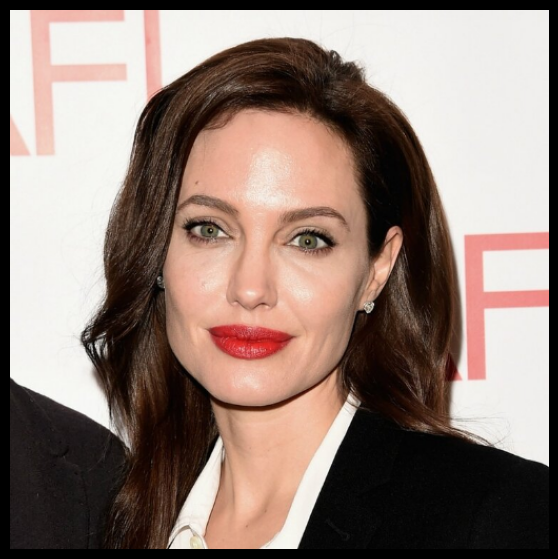

In [ ]:
pic = cv2.imread('/content/0_13b6a6_d7d72f6d_XXL.jpg')
pic = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB)
pic = pic[:752, :]
pic = cv2.resize(pic, (512, 512))

plt.figure(figsize=(7, 7), facecolor='black')
plt.imshow(pic)
plt.axis('off')
plt.show()

Востановленная фотография после небольшой маски:

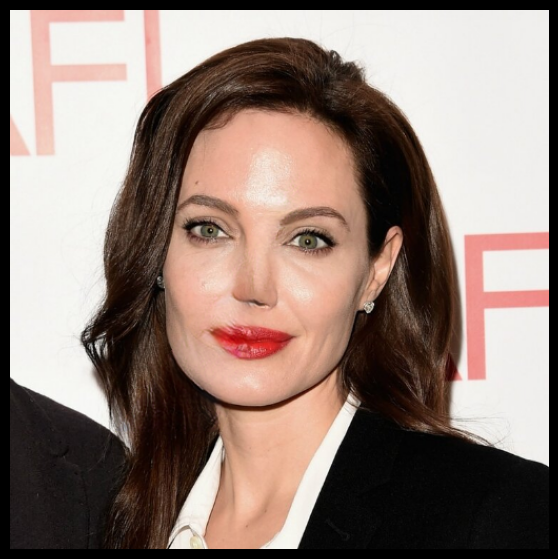

In [ ]:
plt.figure(figsize=(7, 7), facecolor='black')
plt.imshow(plt.imread('img_0_CelebA.png'))
plt.axis('off')
plt.show()

Улучшенная фотография с помощью GPEN (уеличилось разрешение и появился макияж):

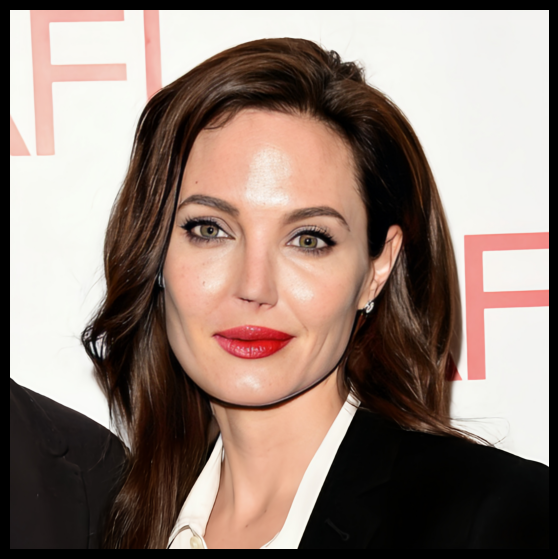

In [ ]:
plt.figure(figsize=(7, 7), facecolor='black')
plt.imshow(plt.imread('img_0_FFHQ_GPEN.jpg'))
plt.axis('off')
plt.show()

Результат замены лиц:

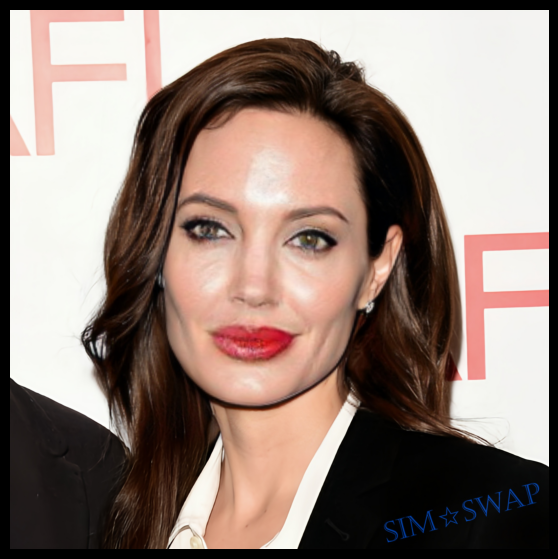

In [ ]:
plt.figure(figsize=(7, 7), facecolor='black')
plt.imshow(plt.imread('result_whole_swapsingle.jpg'))
plt.axis('off')
plt.show()